In [1]:
#importing cell:

import matplotlib.pyplot as plt
import seaborn as sns

from dask.distributed import Client, SSHCluster
import dask.bag as db
from dask import delayed
import dask.dataframe as dd

import json
import csv

import numpy as np
import pandas as pd

import time
import os

import nltk
from string import punctuation

from collections import Counter

#dask config stuff:

import dask.config as dcf
import yaml
from pathlib import Path


***

## MAPD-B final assignment
### Group 9bis:
###### Gaudio Raffaele
###### Zanoli Alessandro

***


# Analysis of Covid-19 papers

This distributed computing project will be focused on the analysis of a number of papers about COVID-19, SARS-CoV-2, and related coronaviruses. The dataset is a sub-sample taken from the original dataset that is composed of more than 75000 (and still growing) papers. This dataset is a part of real-world research on COVID-19 named COVID-19 Open Research Dataset Challenge (CORD-19).

## Dataset description

The database was downloaded from [Kaggle](https://www.kaggle.com/datasets/allen-institute-for-ai/CORD-19-research-challenge) servers using the official Kaggle CLI tool directly into a volume mounted as a NFS (_Network File System_) shared among the cluster. 
We selected 

In [3]:
!ls /nfsvol/document_parses/pdf_json_oneline | wc -l

1500


papers from the 400000+ dataset of `.json` parses of the original PDF documents that are available in the Kaggle dataset, and deleted newline characters from them using a bash script in order to load each paper as an individual element in a `dask.Bag` using `dask.Bag.read_text` method:

In [4]:
!cat /nfsvol/document_parses/script.sh

# script to copy 1500 random papers from the pdf_json dir into another dir
# and remove newline char via jq parsing

cd pdf_json/

for OUTPUT in $(ls | shuf -n 1500)
do
	echo Parsing $OUTPUT...
	jq -c '.' $OUTPUT > ../pdf_json_oneline/$OUTPUT
done


Papers are arranged in a semi-structured fashion via the nested `key:value` pairs stored in the `.json` format. Each paper is guaranteed to have a unique `paper_id` field to identify the paper. 

## Cluster initialization

Our cluster consists of three separated VMs (_virtual machines_) that are hosted in the CloudVeneto computing server; one of them will act as the *client* running the Jupyter Notebook, one will host the *scheduler* and the last one will run the *workers*. 

The Dask library allows the deployment of the cluster remotely on said machines via SSH protocol, once the authentication keys have been exchanged between the client node and the scheduler/workers ones:

In [5]:
cluster = SSHCluster(

    ["10.67.22.118", # scheduler IP 
     "10.67.22.155"], # workers IP
     #"10.67.22.118"], 
    
    connect_options={"known_hosts": None},

    worker_options={"n_workers": 4},

    scheduler_options={"port": 8798, "dashboard_address": ":8797"}
   

)

client = Client(cluster)
client

2022-07-27 07:31:52,572 - distributed.deploy.ssh - INFO - 2022-07-27 07:31:52,564 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2022-07-27 07:31:52,630 - distributed.deploy.ssh - INFO - 2022-07-27 07:31:52,624 - distributed.scheduler - INFO - State start
2022-07-27 07:31:52,635 - distributed.deploy.ssh - INFO - 2022-07-27 07:31:52,629 - distributed.scheduler - INFO - Clear task state
2022-07-27 07:31:52,639 - distributed.deploy.ssh - INFO - 2022-07-27 07:31:52,630 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.118:8798
2022-07-27 07:31:55,733 - distributed.deploy.ssh - INFO - 2022-07-27 07:31:55,724 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.155:35065'
2022-07-27 07:31:55,744 - distributed.deploy.ssh - INFO - 2022-07-27 07:31:55,737 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.155:43335'
2022-07-27 07:31:55,7

Connection method: Cluster object,Cluster type: distributed.SpecCluster
Dashboard: http://10.67.22.118:8797/status,
Dashboard: http://10.67.22.118:8797/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.67.22.118:8798,Workers: 0
Dashboard: http://10.67.22.118:8797/status,Total threads: 0
Started: Just now,Total memory: 0 B


## Task 1 - Word counter distributed algorithm

The first task is to count all the occurrences of each word in all of the documents. In order to do this and optimize the algorithm performance via Dask parallelization, we will need to split the algorithm in two phases:

+ *map phase*: for each document, produce a list of `key:value` pairs representing the word and its count

+ *reduce phase:* aggregate the values from all pairs with the same key to produce a final list of `key:value` representing the total count on all the documents

### Map phase

First, we load each `.json` as an element of a `dask.Bag`; by default, this method creates an array distributed in `n` partitions where `n` is the number of files read, and each element of the array is a line of the files.
Since we already processed the Kaggle `.json` to have no newlines, by default this method will produce an array of `n` elements divided in `n` partitions.

We then map to each of these elements the `json.loads` function, which parses a string and returns a Python dictionary with the same structure as the original `.json` file intended:

In [6]:
%%time

b = db.read_text(
    '/nfsvol/document_parses/pdf_json_oneline/*.json',
    files_per_partition=100
    ).map(json.loads)

CPU times: user 37.2 ms, sys: 20.6 ms, total: 57.7 ms
Wall time: 65.3 ms


In [7]:
b.take(1)

({'paper_id': '003724fa91df947ce239b70e1aeb8db24841075e',
  'metadata': {'title': 'Natural Host-Environmental Media-Human: A New Potential Pathway of COVID-19 Outbreak',
   'authors': [{'first': 'Miao',
     'middle': [],
     'last': 'Li',
     'suffix': '',
     'affiliation': {'laboratory': '',
      'institution': 'Tsinghua University',
      'location': {'postCode': '100084',
       'settlement': 'Beijing',
       'country': 'China'}},
     'email': ''},
    {'first': 'Yunfeng',
     'middle': [],
     'last': 'Yang',
     'suffix': '',
     'affiliation': {'laboratory': '',
      'institution': 'Tsinghua University',
      'location': {'postCode': '100084',
       'settlement': 'Beijing',
       'country': 'China'}},
     'email': ''},
    {'first': 'Yun',
     'middle': [],
     'last': 'Lu',
     'suffix': '',
     'affiliation': {'laboratory': '',
      'institution': 'Tsinghua University',
      'location': {'postCode': '100084',
       'settlement': 'Beijing',
       'countr

`b` is now (or will be when the task will be executed in full) an array of dictionaries; we want it to become an array of strings, with each element being the full body text of the paper. 
We will also incorporate here the text 'cleaning' procedure _(i.e. removing punctuation, stop words, and lower-upper case distinction)_ and the 'tokenizing' procedure _(i.e. transform the full text string into a list of words)_. Those are both common NLP procedures and are often implemented in feature extraction routines in popular ML libraries such as `sklearn`; we will do this manually but will make use of a look up table for stop words from the `nltk` library.

In [8]:
# this will download the stopwords table if not present
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/ubuntu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [9]:
%%time

stopwords=nltk.corpus.stopwords.words('english') + ['','et','al','may','also'] # add null string and other words
table1 = str.maketrans('','',punctuation) # translation table to remove punctuation
table2 = str.maketrans('','','1234567890') # translation table to remove numbers

def get_tokens(paper_json,stopwords,table_pun,table_num):
    
    # merging
    text = ''
    for paragraph in paper_json['body_text']:
        text += paragraph['text'] + ' ' # separate each paragraph via a white space
    
    text = text.lower().translate(table_pun).translate(table_num)
    words = [word for word in text.split(' ') if word not in stopwords] # tokenize and remove null strings and stopwords
    
    return words

b_tokens=b.map(get_tokens,stopwords=stopwords,table_pun=table1,table_num=table2)

CPU times: user 8.3 ms, sys: 34 µs, total: 8.34 ms
Wall time: 29.2 ms


In [10]:
%%time

#map phase:

def get_counts(tokens):
    return list(Counter(tokens).items())

words=b_tokens.map(get_counts).flatten() # we run flatten to forget about the paper grouping

CPU times: user 378 µs, sys: 0 ns, total: 378 µs
Wall time: 383 µs


As our pipeline of mapped functions is applied to each partition separately, and no communication of results between processes is needed, the resulting workload is embarassingly parallel. We can see that by visualizing the (pretty large) related graph:

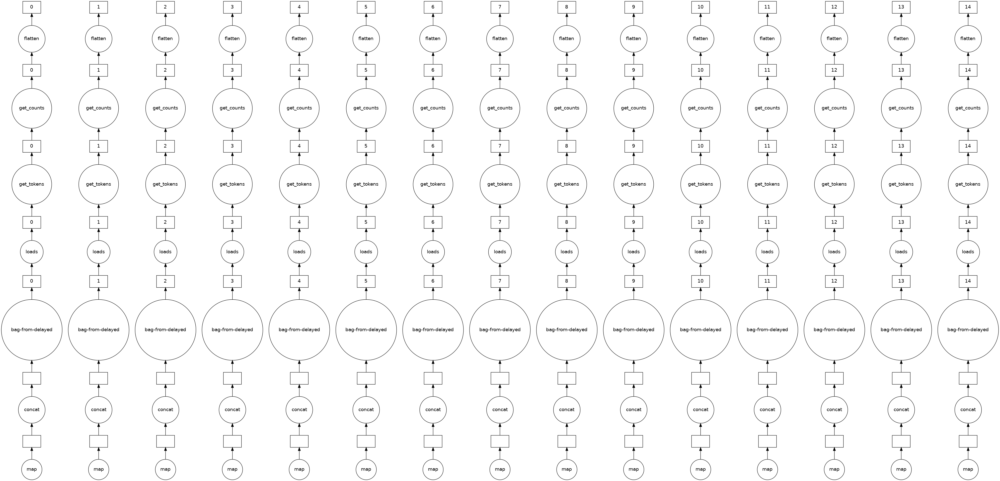

In [11]:
words.visualize()

The optimized graph will condense the pipelined parallel tasks into a single one for easier visualization, we will see that later on.
Now, what we are left with is a list of `(key,value)` tuples, with the key being the word and the value being the count in one paper. This is where we move on to the...

### Reduce phase

Now we will reduce by grouping over the `key` (which is the first element of each tuple) and for each group sum up the values in the second element of the touple which is the `count`. We can do this via the `.foldby()` Dask Bag method, which is much more optimized than computing the `.groupby()` operation first and then `.reduce()` each group because the `.foldby()` method walks through the data accumulating a result for each key rather than shuffling up all the `(key,value)` pairs and then reducing. The final result is the same but `.foldby()` is much faster as it requires minimal communication between workers.

In [12]:
%%time

def binop(tot,x):
    return tot+x[1]

def combine(x, y):
    return x + y

total_words=words.foldby(lambda x:x[0], binop=binop,
                                 initial=0, combine=combine, 
                                 combine_initial=0,split_every=4)

CPU times: user 474 µs, sys: 132 µs, total: 606 µs
Wall time: 584 µs


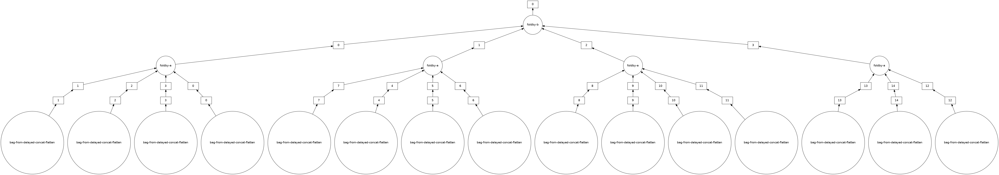

In [13]:
total_words.visualize(optimize_graph=True)

As we can see, the `optimize_graph=True` argument condenses all the parallel mapped function into a single task, and the group operation is split into multiple splits, decided by the `split_every` parameter in the `foldby` call.

#### Splits optimization

Is there an optimal number of splits to ensure minimal communication between workers and maximum efficiency? The default value of `split_every` is 8; let's see how this choice affects the computation time, as this split number determines the layers of subsequent grouping. We will test the same code snippet by trying different splits, but we want do avoid uneven splits that will gain no benefits in termns of number of layers in the computation graph, and may even slow computation times since the second layer of tasks will depend on an uneven amount of the previous tasks.

In [14]:
!mkdir -p ~/benchmark/
benchmark_files = ! ls ~/benchmark/

if 'split_every.txt' in benchmark_files:
    # do not run benchmark again: load the previous one for displaying...
    split_bench = np.loadtxt('./benchmark/split_every.txt')
else:
    
    b = db.read_text(
    '/nfsvol/document_parses/pdf_json_oneline/*.json',
    files_per_partition=10 # a lot more partitions so we can experiment with more split_every values
    ).map(json.loads)

    b_tokens=b.map(get_tokens,stopwords=stopwords,table_pun=table1,table_num=table2)

    words=b_tokens.map(get_counts).flatten()

    words=words.persist() # persist in memory to avoid recomputing all the embarassingly parallel tasks
    
    splits = [i for i in range(2,b_tokens.npartitions) if (b_tokens.npartitions%i == 0)]
    times = []

    for split in splits:
        total_words=words.foldby(lambda x:x[0], binop=binop,
                                     initial=0, combine=combine, 
                                     combine_initial=0,split_every=split)
        tic=time.time()
        total_words.compute()
        toc=time.time()

        times.append(toc-tic)
    
    
    split_bench = np.array([splits,times])
    np.savetxt("./benchmark/split_every.txt",split_bench) # save


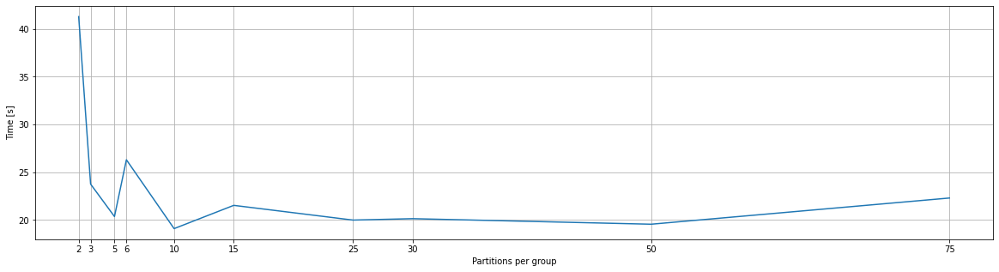

In [15]:
plt.figure(figsize=[20,5])
plt.plot(split_bench[0],split_bench[1])
plt.xticks(split_bench[0])
plt.xlabel('Partitions per group')
plt.ylabel('Time [s]')
plt.grid()

As we can see, setting a very small number of `splits_every` results in many more subsequent grouping operations between partitions with little benefit from the number of workers, as this results in a lot of edges in the graphs. The default value of 8 seems a reasonable starting point and we will leave it at that for our following benchmark, but a different number of partitions may benefit from a more resonable split.

#### Most frequent words

Now that we have reduced our Bag into a more reasonable size, we can call `.compute()` and analyze the most frequent words in our dataset:

In [16]:
%%time

total_words=words.foldby(lambda x:x[0], binop=binop,
                                 initial=0, combine=combine, 
                                 combine_initial=0)

total_words_res=total_words.compute()

CPU times: user 681 ms, sys: 110 ms, total: 792 ms
Wall time: 23.7 s


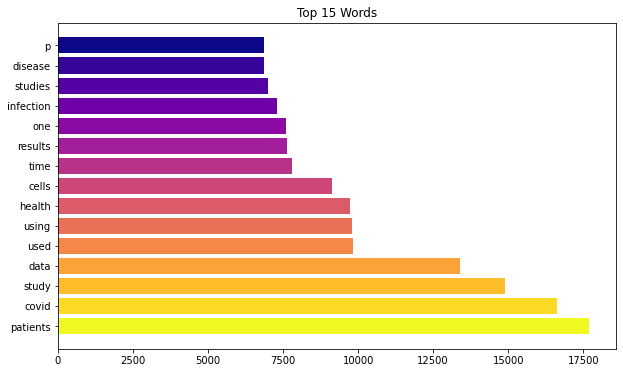

In [17]:
#plot the topwords

# sort by word count descending
total_words_ordered=sorted(total_words_res,key=lambda word: word[1],reverse=True)

N=15
colors = plt.get_cmap('plasma',N).colors[::-1]

def plot_topwords(word_sorted, n):
    height = [word_sorted[i][1] for i in range(0,len(word_sorted))]
    bars = [word_sorted[i][0] for i in range(0,len(word_sorted))]
    y_pos = np.arange(len(bars))
    
    fig, ax = plt.subplots(figsize=(10,6))
    index = n
    
    ax.barh(y_pos[:index], height[:index],color=colors)
    plt.yticks(y_pos[:index], bars[:index])
    ax.set_axisbelow(True)
    ax.set_title('Top 15 Words')

plot_topwords(total_words_ordered, N)

### Task 1 - Benchmark

We now want to explore the space of parallel computing parameters to see how the number of workers and the number of partitions affect the computation. First of all, we shutdown the cluster:

In [18]:
client.shutdown()

Unless otherwise specified, the Dask cluster deploys each worker with a number of threads equal to the number of logical cores in the CPU:

In [29]:
!ssh ubuntu@10.67.22.155 "lscpu | grep CPU"

CPU op-mode(s):                  32-bit, 64-bit
CPU(s):                          4
On-line CPU(s) list:             0-3
CPU family:                      6
Model name:                      Intel(R) Xeon(R) CPU E5-2670 v2 @ 2.50GHz
CPU MHz:                         2499.972
NUMA node0 CPU(s):               0-3
Vulnerability Mds:               Mitigation; Clear CPU buffers; SMT Host state unknown


Our machine has 4 cores; in fact, if we spawn the cluster:

In [30]:
cluster = SSHCluster(

    ["10.67.22.118", # scheduler IP 
     "10.67.22.155"], # workers IP
     #"10.67.22.118"], 
    
    connect_options={"known_hosts": None},

    worker_options={"n_workers": 4},

    scheduler_options={"port": 8798, "dashboard_address": ":8797"}
   

)

client = Client(cluster)

2022-07-27 08:39:54,457 - distributed.deploy.ssh - INFO - 2022-07-27 08:39:54,453 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2022-07-27 08:39:54,513 - distributed.deploy.ssh - INFO - 2022-07-27 08:39:54,510 - distributed.scheduler - INFO - State start
2022-07-27 08:39:54,518 - distributed.deploy.ssh - INFO - 2022-07-27 08:39:54,515 - distributed.scheduler - INFO - Clear task state
2022-07-27 08:39:54,521 - distributed.deploy.ssh - INFO - 2022-07-27 08:39:54,516 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.118:8798
2022-07-27 08:39:56,081 - distributed.deploy.ssh - INFO - 2022-07-27 08:39:56,083 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.155:42029'
2022-07-27 08:39:56,092 - distributed.deploy.ssh - INFO - 2022-07-27 08:39:56,095 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.155:36439'
2022-07-27 08:39:56,0

In [31]:
for worker in client.scheduler_info()['workers']:
    print('Worker at ',worker)
    print('N of threads: ',client.scheduler_info()['workers'][worker]['nthreads'],'\n\n')

Worker at  tcp://10.67.22.155:37369
N of threads:  4 


Worker at  tcp://10.67.22.155:38579
N of threads:  4 


Worker at  tcp://10.67.22.155:44405
N of threads:  4 


Worker at  tcp://10.67.22.155:44489
N of threads:  4 




When executing pure Python code, the Python Global Interpreter Lock (GIL) only allows a single thread per Python interpreter, thus making each Python process unable to multi-thread. When this happens, the convenient way to parallelize such computations is to spawn multiple processes with a single thread each.

#### Grid search

Let's evalute the computing time in a grid of parameter where we decide the number of worker processes, the number of threads to assign to each of them, and the number of partitions.

In [32]:
client.shutdown()

2022-07-27 08:40:48,260 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client


And wrap our whole computation into a function that initializes a cluster with given parameters:

In [23]:
# we will spawn n workers in each machine where n is the number of VMs available.
# this means that we will have 3xn workers at each stap where n is 

# defining grid values
nworkers = [1,2,3,4]
nthreads = [1,2,3,4]
nfilesperpartition = [1,5,20,50,75,100,150,200,250,300,350,400,450,500]

In [24]:
def benchmark_task1(nwork,nthr,nfiles,verbose=False):
    
    filename = 'task1_{}_{}_{}.txt'.format(nwork,nthr,nfiles)
    benchmark_files = ! ls ~/benchmark/
    
    if filename not in benchmark_files:

        if verbose: 
            print('Cluster initialization...')    
            print('\n\n------------------\n')
            print('Starting benchmark with {} workers with {} threads each...'.format(nwork,nthr))
            print("Number of files per partition: {}".format(nfiles))
            print('\n------------------')

        cluster = SSHCluster(
        ["10.67.22.118", # scheduler IP 
         "10.67.22.155", # workers IP
        "10.67.22.118" ,
        "10.67.22.10"], 
        connect_options={"known_hosts": None},
        worker_options={"n_workers": nwork,
                       "nthreads":nthr}, 
        scheduler_options={"port": 8798, "dashboard_address": ":8797"})

        client = Client(cluster)



        tic = time.time()

        # data loading

        b = db.read_text(
        '/nfsvol/document_parses/pdf_json_oneline/*.json',
        files_per_partition=nfiles 
        ).map(json.loads)

        

        b_tokens=b.map(get_tokens,stopwords=stopwords,table_pun=table1,table_num=table2)
        words=b_tokens.map(get_counts).flatten()

        total_words=words.foldby(lambda x:x[0], binop=binop,
                                     initial=0, combine=combine, 
                                     combine_initial=0)
        # compute
        total_words.compute()

        toc = time.time()

        client.shutdown()

        # save on disk
        np.savetxt('./benchmark/'+filename,np.array([toc-tic]))
        
        return None
    else:
        print("Found previous benchmark for ",filename)
        pass

And now we define the function that runs the benchmark for each combination of `nworkers,nthreads,nfilesperpartition`:

In [22]:
def grid_search(nworkers,nthreads,nfilesperpartition,benchmark_fun):
    
    
    # pre allocating the computation times
    times = np.zeros((len(nworkers),len(nthreads),len(nfilesperpartition)))
    
    for i,nwork in enumerate(nworkers):
        for j,nthr in enumerate(nthreads):
            for k,nfiles in enumerate(nfilesperpartition):
                benchmark_fun(nwork,nthr,nfiles,verbose=True)
    
    return None

And we run it. The script is designed to save each iteration separately in order to recover from possible failures.

In [26]:
grid_search(nworkers,nthreads,nfilesperpartition,benchmark_task1)

Found previous benchmark for  task1_1_1_1.txt
Found previous benchmark for  task1_1_1_5.txt
Found previous benchmark for  task1_1_1_20.txt
Found previous benchmark for  task1_1_1_50.txt
Found previous benchmark for  task1_1_1_75.txt
Found previous benchmark for  task1_1_1_100.txt
Found previous benchmark for  task1_1_1_150.txt
Found previous benchmark for  task1_1_1_200.txt
Found previous benchmark for  task1_1_1_250.txt
Found previous benchmark for  task1_1_1_300.txt
Found previous benchmark for  task1_1_1_350.txt
Found previous benchmark for  task1_1_1_400.txt
Found previous benchmark for  task1_1_1_450.txt
Found previous benchmark for  task1_1_1_500.txt
Found previous benchmark for  task1_1_2_1.txt
Found previous benchmark for  task1_1_2_5.txt
Found previous benchmark for  task1_1_2_20.txt
Found previous benchmark for  task1_1_2_50.txt
Found previous benchmark for  task1_1_2_75.txt
Found previous benchmark for  task1_1_2_100.txt
Found previous benchmark for  task1_1_2_150.txt
Found 

Now we load the benchmark and create a hierarchical table in which to store the times values:

In [27]:
task1_bench_files = !ls ./benchmark/task1*
params = np.array([filename.split(".")[-2].split('_')[-3:] for filename in task1_bench_files],dtype=int)
times = np.array([np.loadtxt(filename) for filename in task1_bench_files])
params=pd.DataFrame(np.concatenate([params,times.reshape(-1,1)],axis=1),columns=['n_workers','n_threads','files_per_partition','time'])
params=params.astype(
    {
        'n_workers':int,
        'n_threads':int,
        'files_per_partition':int,
        'time':float
    }
)
params['n_workers']*=3 # scale up to actual number of workers in the cluster

params = pd.pivot_table(params,values='time',index=['files_per_partition','n_threads'],columns=['n_workers'])
params.head()

n_workers                             3          6          9          12
files_per_partition n_threads                                            
1                   1          54.537822  29.801577  18.538084  17.850322
                    2          37.259733  27.857259  20.581686  18.451236
                    3          45.540071  25.798174  25.103046  18.510301
                    4          43.953715  31.893017  25.352165  18.805858
5                   1          19.507978  18.410455  16.514313  16.381815

And, for each number of files per partition (which is inversely proportional to the number of partitions) we plot a heatmap:

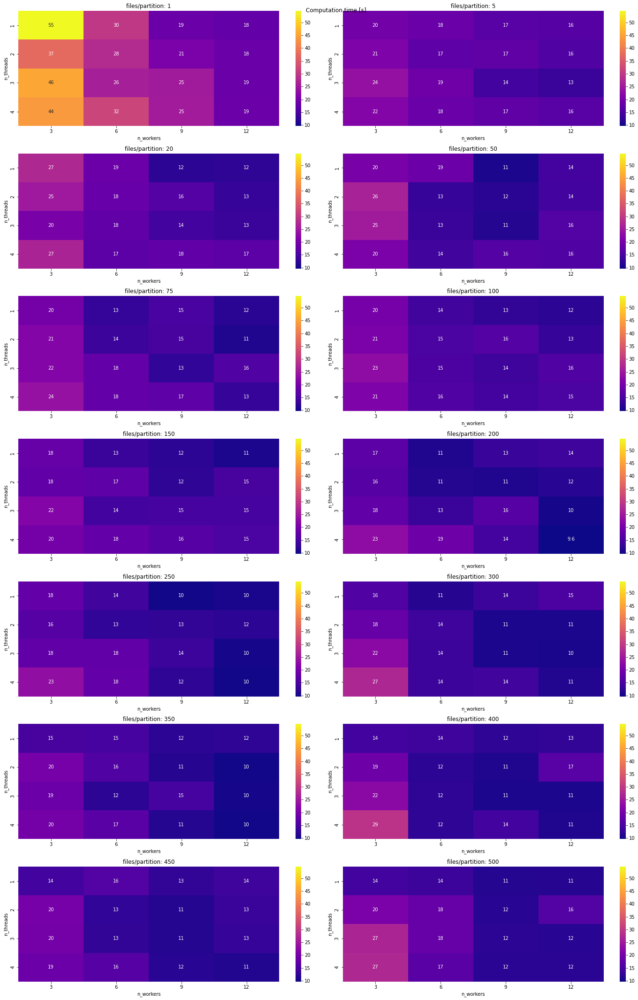

In [28]:
fig,axs=plt.subplots(int(len(nfilesperpartition)/2),2,figsize=[20,30])

# normalize colorbars equally
vmax=params.max().max()
vmin=params.min().min()

for i,nfiles in enumerate(params.index.get_level_values('files_per_partition').unique()):
    axs.flatten()[i].set_title('files/partition: {}'.format(nfiles))
    sns.heatmap(params.loc[nfiles],ax=axs.flatten()[i],vmax=vmax,vmin=vmin,annot=True,cmap='plasma')
    
fig.suptitle('Computation time [s]')
fig.tight_layout()
plt.show()

The heatmap shows, as a general trend, that **multitasking is always better than multithreading**, as we expected given that most of our code relies on pure Python calls.

Let's see how one multitasking configuration (9 processes with 1 thread) compares with another multithreading configuration (3 processes with 3 threads) given different number of partitions:

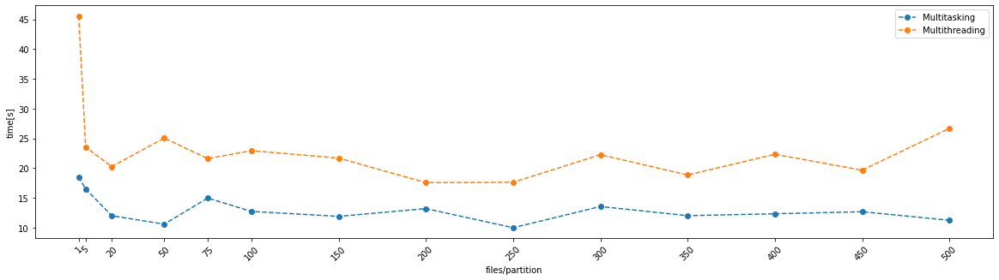

In [29]:
# maybe see how the multitasking (9 processes 1 thread)
# compares with the multithreading (3 processes 3 threads)
fig,ax=plt.subplots(figsize=[20,5])
ax.plot(params.swaplevel().loc[1][9],label='Multitasking',linestyle='--',marker='o')
ax.plot(params.swaplevel().loc[3][3],label='Multithreading',linestyle='--',marker='o')
ax.legend()
ax.set_xlabel('files/partition')
ax.set_ylabel('time[s]')
ax.set_xticks(params.swaplevel().loc[1][9].index)
plt.xticks(rotation=45)
plt.show()




This plot tells us that a very high number of partitions (1 for each file!) is highly inefficient due possibly to communication between tasks: the more the partitions, the more communication between the results of the parallel tasks need to take place.
But later on the number partitions does not influence monotonically the computation time; this is due possibly to the creation of the task graph and thus an optimal number of partition may depend on the number of splits in the `foldby` call.

## Task 2 - Which are the worst and best-represented countries in the research?

In order to analyzed which as the worst and best represented countries in the research, we will take a look at the `authors` field of each paper: this is a list of dictionaries containing (when present) the name, surname, and most importantly, the affiliation of said authors, specifying the institution and the country of origin. Let's operate on the Dask Bag of dictionaries, and define a function to map onto it that returns `('country':country,'institution':institution)`:

In [30]:
# ----------- launch cluster again

cluster = SSHCluster(

    ["10.67.22.118", # scheduler IP 
     "10.67.22.155", # workers IP
     "10.67.22.118",
     "10.67.22.10"], 
    
    connect_options={"known_hosts": None},

    worker_options={"n_workers": 3,
                   'memory_limit':'auto',
                   "nthreads": 1},

    scheduler_options={"port": 8798, "dashboard_address": ":8797"}
   

)

client = Client(cluster)
client

2022-07-27 07:32:44,978 - distributed.deploy.ssh - INFO - 2022-07-27 07:32:44,971 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2022-07-27 07:32:45,032 - distributed.deploy.ssh - INFO - 2022-07-27 07:32:45,025 - distributed.scheduler - INFO - State start
2022-07-27 07:32:45,036 - distributed.deploy.ssh - INFO - 2022-07-27 07:32:45,029 - distributed.scheduler - INFO - Clear task state
2022-07-27 07:32:45,040 - distributed.deploy.ssh - INFO - 2022-07-27 07:32:45,030 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.118:8798
/usr/local/lib/python3.8/dist-packages/distributed/client.py:1274: VersionMismatchWarning: Mismatched versions found

+---------+--------+-----------+---------+
| Package | client | scheduler | workers |
+---------+--------+-----------+---------+
| tornado | 6.2    | 6.1       | None    |
+---------+--------+-----------+---------+
  warnings.w

<Client: 'tcp://10.67.22.118:8798' processes=3 threads=3, memory=5.83 GiB>

In [31]:
def get_country_institution(paper):

    country=''
    institution=''
    
    if 'institution' in paper['affiliation'].keys():
        institution=paper['affiliation']['institution']
    else:
        institution=None
        
    if 'location' in paper['affiliation'].keys():
        if 'country' in paper['affiliation']['location'].keys():
            country=paper['affiliation']['location']['country']
        else: country=None
    else: country=None
        
    if country == '': country = None
    if institution == '': institution = None
        
    return {'country':country,'institution':institution}

In [32]:
%%time

authors=b.pluck('metadata').pluck('authors')

CPU times: user 467 µs, sys: 146 µs, total: 613 µs
Wall time: 628 µs


In [33]:
%time

#map + filter to remove None

country_institution=authors.flatten()\
                           .map(get_country_institution)\
                           .filter(lambda x: x['country'] is not None and x['institution'] is not None)

CPU times: user 6 µs, sys: 2 µs, total: 8 µs
Wall time: 17.2 µs


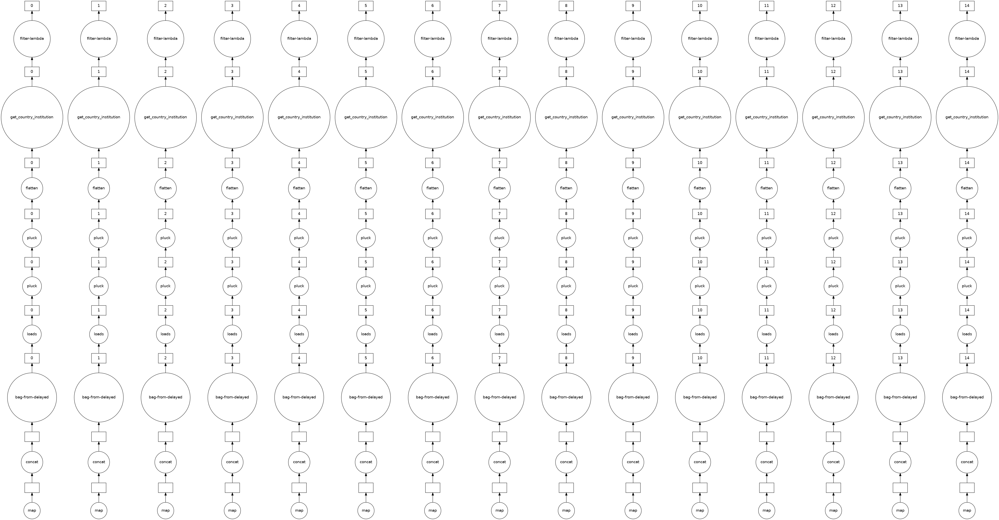

In [34]:
country_institution.visualize()

In [35]:
%%time

#get the count of countries

def incr(tot, _):
    return tot+1

total_country=country_institution.foldby(key='country',
                                         binop=incr, 
                                         initial=0, 
                                         combine=combine, 
                                         combine_initial=0).compute()

CPU times: user 42.1 ms, sys: 3.28 ms, total: 45.4 ms
Wall time: 1 s


In [36]:
%%time

#get the count of institutions

total_institution=country_institution.foldby(key='institution',
                                             binop=incr, 
                                             initial=0, 
                                             combine=combine, 
                                             combine_initial=0).compute()

CPU times: user 56.8 ms, sys: 1.29 ms, total: 58.1 ms
Wall time: 667 ms


In [37]:
%%time

#sort everithing in decrescent order

total_country_ordered=sorted(total_country,key=lambda country: country[1],reverse=True)

total_institution_ordered=sorted(total_institution,key=lambda institution: institution[1],reverse=True)

CPU times: user 223 µs, sys: 0 ns, total: 223 µs
Wall time: 226 µs


Now we can visualize the best represented countries and institutions:

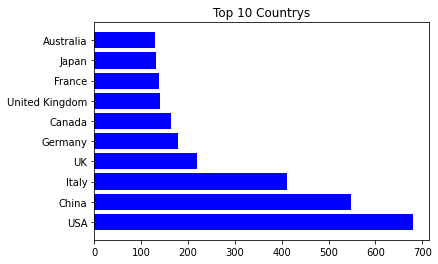

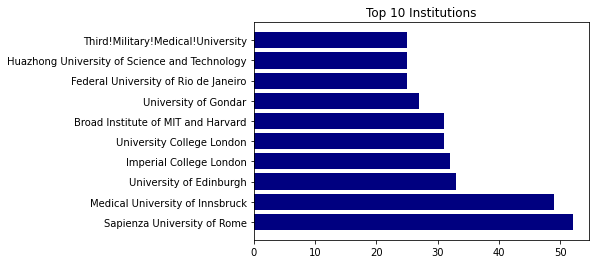

In [38]:
N=10

def plot_best_county(country_sorted, n):
    height = [country_sorted[i][1] for i in range(0,len(country_sorted))]
    bars = [country_sorted[i][0] for i in range(0,len(country_sorted))]
    y_pos = np.arange(len(bars))
    
    fig, ax = plt.subplots(figsize=(6,4))
    index = n
    
    ax.barh(y_pos[:index], height[:index],color='blue')
    plt.yticks(y_pos[:index], bars[:index])
    ax.set_axisbelow(True)
    ax.set_title('Top {} Countrys'.format(n))
    
def plot_best_institution(institution_sorted, n):
    height = [institution_sorted[i][1] for i in range(0,len(institution_sorted))]
    bars = [institution_sorted[i][0] for i in range(0,len(institution_sorted))]
    y_pos = np.arange(len(bars))
    
    fig, ax = plt.subplots(figsize=(6,4))
    index = n
    
    ax.barh(y_pos[:index], height[:index],color='navy')
    plt.yticks(y_pos[:index], bars[:index])
    ax.set_axisbelow(True)
    ax.set_title('Top {} Institutions'.format(n))    
    

plot_best_county(total_country_ordered, N)

plot_best_institution(total_institution_ordered, N)

In [39]:
%%time

#sort everithing in crescent order

total_country_ordered=sorted(total_country,key=lambda country: country[1],reverse=False)

total_institution_ordered=sorted(total_institution,key=lambda institution: institution[1],reverse=False)

CPU times: user 0 ns, sys: 852 µs, total: 852 µs
Wall time: 317 µs


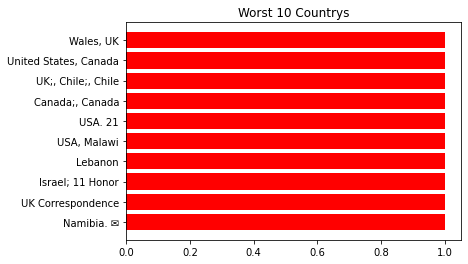

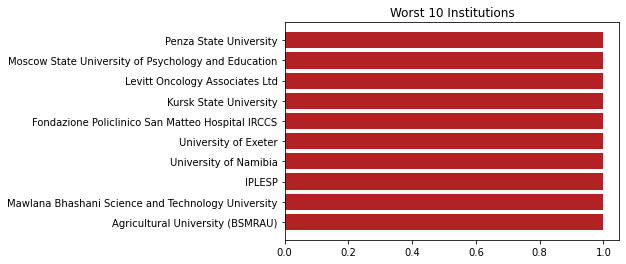

In [40]:
N=10

def plot_worst_county(country_sorted, n):
    height = [country_sorted[i][1] for i in range(0,len(country_sorted))]
    bars = [country_sorted[i][0] for i in range(0,len(country_sorted))]
    y_pos = np.arange(len(bars))
    
    fig, ax = plt.subplots(figsize=(6,4))
    index = n
    
    ax.barh(y_pos[:index], height[:index],color='red')
    plt.yticks(y_pos[:index], bars[:index])
    ax.set_axisbelow(True)
    ax.set_title('Worst {} Countrys'.format(n))
    
def plot_worst_institution(institution_sorted, n):
    height = [institution_sorted[i][1] for i in range(0,len(institution_sorted))]
    bars = [institution_sorted[i][0] for i in range(0,len(institution_sorted))]
    y_pos = np.arange(len(bars))
    
    fig, ax = plt.subplots(figsize=(6,4))
    index = n
    
    ax.barh(y_pos[:index], height[:index],color='firebrick')
    plt.yticks(y_pos[:index], bars[:index])
    ax.set_axisbelow(True)
    ax.set_title('Worst {} Institutions'.format(n))    
    

plot_worst_county(total_country_ordered, N)

plot_worst_institution(total_institution_ordered, N)

In [41]:
# shut down client for next ex

client.shutdown()

Listing by least active countries we see that some of the `.json` had a non-compliant filling of the `country` field, i.e. multiple countries at once, or numbers in them. One way to solve this would involve some text processing and possibly a look-up table to test for known country names.

## Task 3 - Get the embedding for the title of the papers

In NLP a common technique for performing analysis over a set of texts is to transform the text into a set of vectors each one representing a word inside a document. At the end of the pre-processing the document will be transformed into a list of vectors or a matrix of $n \times m$ where $n$ is the number of words in the document and $m$ is the size of the vector that represents the word $n$.

We will make use of a pre-trained model that will assign to each word its vector representation; the file is located, again, in the shared volume `/dataNfs/wiki.en.vec`, but it's too big to load within the client environment using the provided code; we will instead load it inside a Dask DataFrame, with $n$ rows, one for each word, and $m+1$ columns, the first one being the word, and the rest the coordinates of the "embedded" representation.


How is the `wiki.en.vec` file structured? According to the [source](https://fasttext.cc/docs/en/english-vectors.html):

> The first line of the file contains the number of words in the vocabulary and the size of the vectors. Each line contains a word followed by its vectors, like in the default fastText text format. Each value is space separated. Words are ordered by descending frequency.

Our approach will be:

1. Create a distributed Dask DataFrame like: `paper_id:title:word`
2. Load the model as a distributed Dask DataFrame like `word:coord_1:...:coord_m`
3. Perform an inner join that will leave us with a DF like `paper_id:word:coord_1:...:coord_m`

From the last table we can perform calculations on the embedded representations of the titles, by reducing the dataframe and grouping by the `paper_id` key. 


In [2]:
# ----------- launch cluster again

cluster = SSHCluster(

    ["10.67.22.118", # scheduler IP 
     "10.67.22.155", # workers IP
     "10.67.22.118",
     "10.67.22.10"], 
    
    connect_options={"known_hosts": None},
    
    worker_options={"n_workers": 2,
                   'memory_limit':'auto',
                   'nthreads':2}, 

    scheduler_options={"port": 8798, "dashboard_address": ":8797"}
   

)

client = Client(cluster)
client

2022-07-27 07:52:38,936 - distributed.deploy.ssh - INFO - 2022-07-27 07:52:38,931 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2022-07-27 07:52:38,989 - distributed.deploy.ssh - INFO - 2022-07-27 07:52:38,985 - distributed.scheduler - INFO - State start
2022-07-27 07:52:38,993 - distributed.deploy.ssh - INFO - 2022-07-27 07:52:38,989 - distributed.scheduler - INFO - Clear task state
2022-07-27 07:52:38,997 - distributed.deploy.ssh - INFO - 2022-07-27 07:52:38,990 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.118:8798
2022-07-27 07:52:40,329 - distributed.deploy.ssh - INFO - 2022-07-27 07:52:40,327 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.10:33579'
2022-07-27 07:52:40,359 - distributed.deploy.ssh - INFO - 2022-07-27 07:52:40,358 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.10:40053'
2022-07-27 07:52:40,738

<Client: 'tcp://10.67.22.118:8798' processes=4 threads=8, memory=15.54 GiB>

#### 1. Create the `paper_id:word_in_title` DataFrame

As always, we begin by loading the `.json` files in a Dask Bag and mapping them to a `.json` parser, extract the features we want (`paper_id` and `title`), then _explode_ the dataframe expanding the entries by the words in the title. First let's (re)define the mapped functions to extract the structured DataFrame:

In [43]:
# ------------------- TOKENIZING FUNCTION TO GET THE LIST OF WORDS


stopwords=nltk.corpus.stopwords.words('english') + ['','et','al'] # add null string and other words
table1 = str.maketrans('','',punctuation) # translation table to remove punctuation
table2 = str.maketrans('','','1234567890') # translation table to remove numbers



def tokenize(title,stopwords,table_pun,table_num):
    
    title_list = [word for word in title.translate(table_pun).translate(table_num).split(' ') if word != '']
                  
    return title_list


# ------------------ MAPPING FUNCTION TO EXTRACT FEATURES

def id_and_title(record,stopwords,table_pun,table_num):
    
    paper_id = record['paper_id']
    title = record['metadata']['title']
    title_list = sorted(tokenize(title,stopwords,table_pun,table_num))
    
    return {
        'paper_id' : record['paper_id'],
        'title' : record['metadata']['title'],
        'word' : title_list
    }

Then we load the `.json` and form the dataframe. In this phase, it is also convenient to set an index and sort by that value; it is computationally expensive, but it is worth the time because it will make the join operations much faster (see [Dask documentation](https://docs.dask.org/en/stable/dataframe-joins.html) for joins best practices).

At every step, we will store to disk the sorted DataFrames, for easier future access and to split the computations in order to avoid excessive task load; we store them in `parquet` format, which preserves the sorted index.

In [44]:
%%time

# load papers
b = db.read_text('/nfsvol/document_parses/pdf_json_oneline/*.json').map(json.loads).repartition(10)

# extract paper id and title, and explode on the title words
ids_titles = b.map(id_and_title,stopwords=stopwords,table_pun=table1,table_num=table2).to_dataframe().explode('word')

# drop na values that cause problems with the indexing
ids_titles =ids_titles.dropna(subset=['word'])

CPU times: user 535 ms, sys: 40.5 ms, total: 576 ms
Wall time: 1.41 s


In [45]:
%%time

# save it locally once sorted

! mkdir -p /nfsvol/parquet

ids_titles.set_index('word').to_parquet('/nfsvol/parquet/sorted_ids_titles',
                                          engine='pyarrow',
                                          overwrite=True,
                                          write_metadata_file=True)

CPU times: user 1.03 s, sys: 41.8 ms, total: 1.07 s
Wall time: 13.9 s


#### 2. Create the `word:vec` DataFrame

The model DataFrame will be loaded with Dask's `.read_table()` function, and again sorted to speed up join operations. 

In [46]:
model = dd.read_table('/nfsvol/wiki.en.vec',
                      quoting=csv.QUOTE_NONE, # needed because there's a single quote character somewhere that breaks everything
                      skiprows=1, # first row is useless
                      header=None, 
                      delim_whitespace=True,
                      blocksize='50MB',
                     engine='c')

new_columns = ['word'] + [str(i) for i in range(1,300)]
model = model.rename(columns=dict(zip(model.columns, new_columns))).dropna(subset=['word'])
model.columns = model.columns.astype(str)

model

,word,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
npartitions=131,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [47]:
%%time

# sort and save to disk

model.set_index('word').to_parquet('/nfsvol/parquet/model_sorted',
                                   engine='pyarrow',
                                   overwrite=True,
                                   write_metadata_file=True)

CPU times: user 1.32 s, sys: 107 ms, total: 1.42 s
Wall time: 2min 36s


#### 3. Perform inner join on index

Now we set up the join computation. The DataFrames are already sorted and stored in disk, so we load them and proceed with an inner join on their indices (previously defined as the word).

In [3]:
# load
ids_titles_sorted = dd.read_parquet('/nfsvol/parquet/sorted_ids_titles',engine='pyarrow')
model_sorted = dd.read_parquet('/nfsvol/parquet/model_sorted',engine='pyarrow')

# prepare the join
embedded_papers = ids_titles_sorted.merge(
    model_sorted, how="inner", left_index=True, right_index=True)

# compute the join and persist in memory for later computation
! mkdir -p /nfsvol/parquet
embedded_papers.persist()

,paper_id,title,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
npartitions=131,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,object,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

Let's check and see if the table we obtained has the schema we intended:

In [4]:
embedded_papers.head()

,paper_id,title,1,2,3,4,5,6,7,8,...,291,292,293,294,295,296,297,298,299,300
word,,,,,,,,,,,,,,,,,,,,,
adverse,19b49aa1fdb859934bf71fe6b7a58eeb72cbbd33,The moderating role of parent adverse childhoo...,-0.211470,-0.319370,-0.65390,0.363180,-0.114820,-0.26887,0.059935,-0.36559,...,0.045836,0.305390,-0.094181,-0.09775,-0.36319,-0.009436,0.090307,0.27350,0.11254,-0.254810
adverse,17d85949c672438a19675d2dcabe1faafb7fa5a7,Defining the interval for monitoring potential...,-0.211470,-0.319370,-0.65390,0.363180,-0.114820,-0.26887,0.059935,-0.36559,...,0.045836,0.305390,-0.094181,-0.09775,-0.36319,-0.009436,0.090307,0.27350,0.11254,-0.254810
analgesia,6e78dbe796a79dcea16599d129872c96fd347f9b,Clinical effect of dexmedetomidine combined wi...,0.256090,-0.172080,-0.67141,0.559120,-0.741640,-0.52973,0.248580,-0.45278,...,-0.175670,-0.261140,0.067902,-0.13962,-0.51460,-0.082675,0.370680,0.60639,0.45038,-0.020336
artery,7091b051b5b6b144874d1689546d3058f8226cd7,Vascular and Interventional Radiology Bronchia...,0.361940,-0.092553,0.12473,0.133640,-0.168880,-0.21774,0.358650,-0.44537,...,-0.081305,0.497800,0.217780,-0.24456,-0.44166,0.237880,0.209940,0.58000,-0.17166,-0.052715
corona,0a459f84b730814c578db3b6310423371ddc8ffb,Structural insights of a self-assembling 9-res...,0.022184,-0.092343,0.10719,-0.063805,0.013289,-0.37459,-0.043792,0.24645,...,0.492830,-0.001094,-0.067806,0.40797,0.44550,-0.449890,0.026627,0.36372,0.65778,-0.059822


And finally save the joint table on disk.

In [5]:
# save to disk
embedded_papers.to_parquet('/nfsvol/parquet/embedded_papers',
                          engine='pyarrow',
                          overwrite=True,
                          write_metadata_file=True)

#### Compute cosine similarity

How do we compute cosine similarity between two titles? Every word is a vector in the 300 dimensional space representation; a title is a group of said vectors, so computing a similarity between titles lacks a trivial definitions. 

An approach would be to compute the "average" vector of titles, and then perform a dot product between pairs of them to compute their similarity. We can do this easily grouping the table by `paper_id` and performing a `.mean()` over the vector components:

In [6]:
%%time

# prepare the reduce operation
averaged_embedding=embedded_papers.groupby(['paper_id']).mean().repartition(10)

averaged_embedding

CPU times: user 277 ms, sys: 20.5 ms, total: 298 ms
Wall time: 961 ms


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
npartitions=10,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

At this point, the embedded titles dataframe is small enough to fit comfortably in local memory, so we call the `.compute()` method and retrieve the object:

In [7]:
averaged_embedding = averaged_embedding.compute()

averaged_embedding.head()

,1,2,3,4,5,6,7,8,9,10,...,291,292,293,294,295,296,297,298,299,300
paper_id,,,,,,,,,,,,,,,,,,,,,
0115e9f571d4f936011baac2265ec15f6197bd87,-0.034537,0.047346,-0.101694,0.251091,-0.125582,0.034007,0.116558,-0.149342,-0.078400,0.035217,...,0.156746,-0.012106,0.089544,-0.066144,0.118559,-0.138527,-0.159051,0.117613,0.091982,-0.061865
02b3a7d7d207857319dad3f849a48d4491629eb5,-0.107868,-0.020164,-0.088893,0.194741,-0.219607,-0.067345,0.031582,-0.090395,0.039039,0.177065,...,0.092829,0.037499,0.054182,-0.111127,-0.041643,-0.168325,-0.042453,0.134191,0.178861,-0.040362
03405e37a741229f4fa31760a758f0e4feb66d63,-0.046255,0.000982,0.009786,0.085392,-0.043688,-0.030238,0.007276,-0.127657,-0.036094,0.051542,...,0.066934,-0.139658,-0.005302,0.000633,0.126142,-0.103805,-0.060700,0.060397,-0.099311,0.087127
04ed41e65930d149c546bb78122b946a3985d3b1,-0.094696,0.022448,-0.090986,0.140812,-0.085178,0.009412,0.037335,-0.083953,0.047206,0.211697,...,0.144801,-0.130220,0.095077,0.105338,0.048005,-0.080639,-0.037908,0.138563,-0.087710,0.042469
065dcefa636646d4eb1ce926ee472c621bf0bd37,0.047947,0.080211,-0.070150,0.217148,-0.061523,-0.012529,0.154688,-0.149929,0.027123,0.099807,...,-0.008355,-0.013645,0.056114,0.079696,-0.042254,-0.118417,-0.077020,0.107424,0.069153,-0.174871


From now on, we can work with standard Pandas methods to compute the cosine similarity between articles.

In [8]:
# again, save to disk
averaged_embedding.to_parquet('/nfsvol/parquet/averaged_embedding',
                             engine='pyarrow')

And now to perform the cosine similarity as a matrix multiplication:

In [9]:
# normalize each row 
norm=averaged_embedding.apply(lambda x:x**2).sum(axis=1).apply(lambda x: np.sqrt(x))
normed_averaged_embedding = averaged_embedding.divide(norm,axis=0)

dot_products = normed_averaged_embedding @ normed_averaged_embedding.T
dot_products

paper_id,0115e9f571d4f936011baac2265ec15f6197bd87,02b3a7d7d207857319dad3f849a48d4491629eb5,03405e37a741229f4fa31760a758f0e4feb66d63,04ed41e65930d149c546bb78122b946a3985d3b1,065dcefa636646d4eb1ce926ee472c621bf0bd37,0738152fba8d21b4ae77293a3e2bfd5019a537a7,0867d1d3de47eb20442703a8241e61b53e6a54f8,0a439913558918028bbc4fdac14f042a019a2edd,0a459f84b730814c578db3b6310423371ddc8ffb,0c51979ede361bd6d05992b0672a17543586a462,...,a9f21b4c08ef6cf4b7553c5666b4102d0c984243,3e248f928ce32fb1b6ddb4f312b0985c599b36cc,7204d1cf904e405e90d19bfffc530ec2a8c43126,0e9ef91df6b6b769b606208624f36e457f5468cf,2b8535fe6092cd5fe8da6f500214027ad4ae4cc6,1c1c1e38bc3c71b4b634b86998ed2e12be6c89de,2307783ade447b5d93fe8870ff30cb15f037156e,67ab88f74638a426963ce70425a3b1ab91cb2023,914d646494f09cbb34bbe5da9dfea4c93ad35bb9,7c2b222cb31daa06675cc9f4c575649d768e1a56
paper_id,,,,,,,,,,,,,,,,,,,,,
0115e9f571d4f936011baac2265ec15f6197bd87,1.000000,0.784642,0.620143,0.633597,0.746736,0.731662,0.724167,0.678789,0.734443,0.601496,...,0.514861,0.242862,0.432238,0.397580,0.324611,0.388150,0.388150,0.388150,0.388150,0.244358
02b3a7d7d207857319dad3f849a48d4491629eb5,0.784642,1.000000,0.601400,0.632264,0.781176,0.794949,0.752316,0.775584,0.677249,0.600060,...,0.511557,0.257223,0.494855,0.373441,0.313823,0.401850,0.401850,0.401850,0.401850,0.244522
03405e37a741229f4fa31760a758f0e4feb66d63,0.620143,0.601400,1.000000,0.817769,0.663173,0.653365,0.551375,0.474174,0.637534,0.803816,...,0.260226,0.297182,0.269596,0.297973,0.252480,0.439149,0.439149,0.439149,0.439149,0.229906
04ed41e65930d149c546bb78122b946a3985d3b1,0.633597,0.632264,0.817769,1.000000,0.713774,0.668756,0.543838,0.505008,0.680657,0.842432,...,0.293104,0.321986,0.330079,0.355608,0.218896,0.531604,0.531604,0.531604,0.531604,0.244996
065dcefa636646d4eb1ce926ee472c621bf0bd37,0.746736,0.781176,0.663173,0.713774,1.000000,0.790448,0.789646,0.774656,0.796440,0.713967,...,0.505182,0.326298,0.425977,0.363291,0.290606,0.603057,0.603057,0.603057,0.603057,0.216865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1c1c1e38bc3c71b4b634b86998ed2e12be6c89de,0.388150,0.401850,0.439149,0.531604,0.603057,0.386624,0.392049,0.365124,0.470141,0.457465,...,0.210660,0.222705,0.222587,0.227750,0.152838,1.000000,1.000000,1.000000,1.000000,0.130526
2307783ade447b5d93fe8870ff30cb15f037156e,0.388150,0.401850,0.439149,0.531604,0.603057,0.386624,0.392049,0.365124,0.470141,0.457465,...,0.210660,0.222705,0.222587,0.227750,0.152838,1.000000,1.000000,1.000000,1.000000,0.130526
67ab88f74638a426963ce70425a3b1ab91cb2023,0.388150,0.401850,0.439149,0.531604,0.603057,0.386624,0.392049,0.365124,0.470141,0.457465,...,0.210660,0.222705,0.222587,0.227750,0.152838,1.000000,1.000000,1.000000,1.000000,0.130526


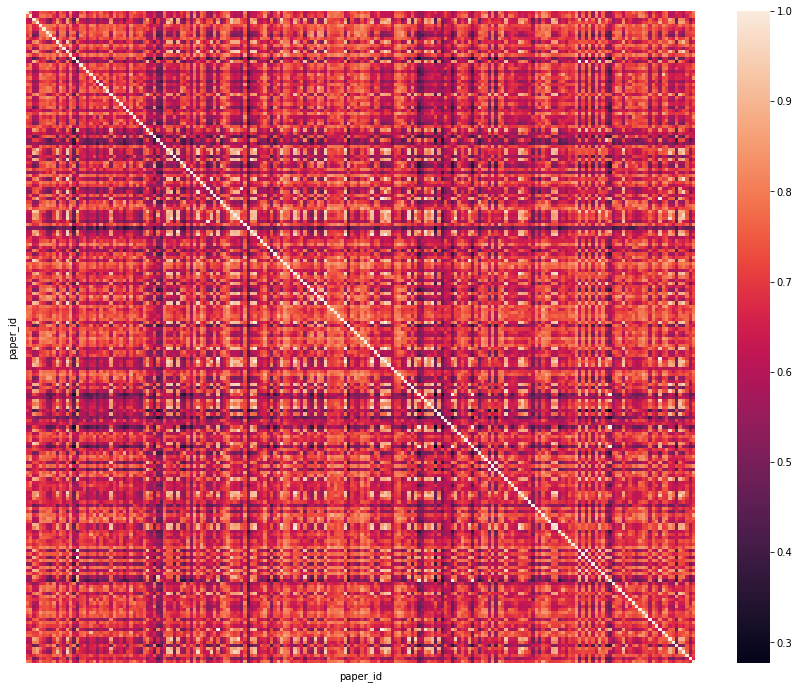

In [10]:
plt.figure(figsize=(15,12))
sns.heatmap(dot_products.iloc[:200,:200],xticklabels=False,yticklabels=False);

Now, for each paper, we find the corresponding paper with the highest similarity in the database thanks to Pandas `.idxmax()` function applied column(or row)-wise: 

In [11]:
df_no_diag = dot_products.mask(np.equal(*np.indices(dot_products.shape))) 

# get the maximum similarity for each row
max_cos_row=df_no_diag.max()
# get the indeces
max_cos_row_id = df_no_diag.idxmax()

Let's, for example, see what the first $N$ papers have as the most similar one:

In [16]:
N = 3
paper1 = list(max_cos_row_id.index.values[:N])
paper2 = list(max_cos_row_id.values[:N])

print(paper1,'\n')
print(paper2)

['0115e9f571d4f936011baac2265ec15f6197bd87', '02b3a7d7d207857319dad3f849a48d4491629eb5', '03405e37a741229f4fa31760a758f0e4feb66d63'] 

['390dc3c6b8a82c69dddf3395e72846d49f5c4a72', 'f9c116b39772514b8a031913faeb80b17b2098e2', '6738a24aff04016a23359b3f82e97ffeb6e37b76']


To get the titles we refer to the sorted `paper_id:title` DataFrame once again:

In [17]:
ids_titles_sorted = dd.read_parquet('/nfsvol/parquet/sorted_ids_titles',engine='pyarrow').set_index('paper_id')

for a,b in zip(paper1,paper2):
    title_a = ids_titles_sorted.loc[a].compute().iloc[0]['title']
    title_b = ids_titles_sorted.loc[b].compute().iloc[0]['title']

    
    print("-----------------")
    print("Paper # 1 : \n",title_a)
    print("Paper # 2 : \n",title_b)
    print("----------------- \n\n")
    

-----------------
Paper # 1 : 
 Using mobile phone data to reveal risk flow networks underlying the HIV epidemic in Namibia
Paper # 2 : 
 Measurability of the epidemic reproduction number in data- driven contact networks SI Appendix
----------------- 


-----------------
Paper # 1 : 
 Vascular access support teams: A multi-disciplinary response to optimise patient care during the COVID-19 pandemic
Paper # 2 : 
 Journal Pre-proof Critical care health professionals' self-reported needs for wellbeing during the COVID-19 pandemic: a thematic analysis of survey responses Title: Critical care health professionals' self-reported needs for wellbeing during the COVID- 19 pandemic: a thematic analysis of survey responses *Equal contribution Affiliations
----------------- 


-----------------
Paper # 1 : 
 Exploring the Public Reaction to COVID-19 News on Social Media in Portugal
Paper # 2 : 
 Automatic Segmentation of Left Ventricle in Echocardiography Based on YOLOv3 Model to Achieve Constraint

In [18]:
# and finally shut down client again

client.shutdown()

### Task 3 - Benchmark

#### Inner join + GroupBy

We will now explore the parameter space in the same way we tested the task 1 computation.

In this part we will test the computation time for the "inner join" and "Group By" operations that produce the final `paper_id:vec` table. The operations required will be:

1. Reading from disk the sorted versions of the `paper_id:title:word` and `word:vec` tables stored in Parquet format
2. Perform the inner join between the two to obtain `paper_id:title:word:vec`
3. Group by the `paper_id` attribute and aggregate computing the mean

First let's define a different function to benchmark this other computation:

In [19]:
def benchmark_task3_joingroupby(nwork,nthr,npartitions,verbose=False):
    
    filename = 'task3_jg_{}_{}_{}.txt'.format(nwork,nthr,npartitions)
    benchmark_files = ! ls ~/benchmark/
    
    if filename not in benchmark_files:
        
        cluster = SSHCluster(
        ["10.67.22.118", # scheduler IP 
         "10.67.22.155", # workers IP
        "10.67.22.118" ,
        "10.67.22.10"], 
        connect_options={"known_hosts": None},
        worker_options={"n_workers": nwork,
                       "nthreads":nthr}, 
        scheduler_options={"port": 8798, "dashboard_address": ":8797"})

        client = Client(cluster)
        
        try:
            
            
            if verbose: 
                print('Cluster initialization...')    
                print('\n\n------------------\n')
                print('Starting benchmark with {} workers with {} threads each...'.format(nwork,nthr))
                print("Number of partitions: {}".format(npartitions))
                print('\n------------------')

            



            tic = time.time()

            # data loading

            # load
            ids_titles_sorted = dd.read_parquet('/nfsvol/parquet/sorted_ids_titles',engine='pyarrow').repartition(npartitions)
            model_sorted = dd.read_parquet('/nfsvol/parquet/model_sorted',engine='pyarrow').repartition(npartitions)

            # prepare the join
            embedded_papers = ids_titles_sorted.merge(
            model_sorted, how="inner", left_index=True, right_index=True)
            # compute
            averaged_embedding=embedded_papers.groupby(['paper_id']).mean().compute()

            toc = time.time()

            client.shutdown()

            # save on disk
            np.savetxt('./benchmark/'+filename,np.array([toc-tic]))

            return None
        except:
            np.savetxt('./benchmark/'+filename,np.array(['failed']),fmt="%s")
            client.shutdown()
    else:
        print("Found previous benchmark for ",filename)
        pass

In [20]:
# defining grid values
nworkers = [1,2,3,4]
nthreads = [1,2,3,4]
npartitions = [5,20,50,100,150,250,300,350,400,450,500,1000]

In [23]:
grid_search(nworkers,nthreads,npartitions,benchmark_task3_joingroupby)

Found previous benchmark for  task3_jg_1_1_5.txt
Found previous benchmark for  task3_jg_1_1_20.txt
Found previous benchmark for  task3_jg_1_1_50.txt
Found previous benchmark for  task3_jg_1_1_100.txt
Found previous benchmark for  task3_jg_1_1_150.txt
Found previous benchmark for  task3_jg_1_1_250.txt
Found previous benchmark for  task3_jg_1_1_300.txt
Found previous benchmark for  task3_jg_1_1_350.txt
Found previous benchmark for  task3_jg_1_1_400.txt
Found previous benchmark for  task3_jg_1_1_450.txt
Found previous benchmark for  task3_jg_1_1_500.txt
Found previous benchmark for  task3_jg_1_1_1000.txt
Found previous benchmark for  task3_jg_1_2_5.txt
Found previous benchmark for  task3_jg_1_2_20.txt
Found previous benchmark for  task3_jg_1_2_50.txt
Found previous benchmark for  task3_jg_1_2_100.txt
Found previous benchmark for  task3_jg_1_2_150.txt
Found previous benchmark for  task3_jg_1_2_250.txt
Found previous benchmark for  task3_jg_1_2_300.txt
Found previous benchmark for  task3_jg

2022-07-27 07:57:43,809 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client


In [20]:
task3_bench_files = !ls ./benchmark/task3*
params = np.array([filename.split(".")[-2].split('_')[-3:] for filename in task3_bench_files],dtype=int)
times = np.array([np.loadtxt(filename,dtype=str) for filename in task3_bench_files])
times[times=='failed']=np.nan # substitute nans in failed benchmarks
times=times.astype(float)

params=pd.DataFrame(np.concatenate([params,times.reshape(-1,1)],axis=1),columns=['n_workers','n_threads','n_partitions','time'])
params=params.astype(
    {
        'n_workers':int,
        'n_threads':int,
        'n_partitions':int,
        'time':float
    }
)
params['n_workers']*=3 # scale up to actual number of workers in the cluster

params = pd.pivot_table(params,values='time',index=['n_partitions','n_threads'],columns=['n_workers'],dropna=False)
params.head()

n_workers                       3           6           9           12
n_partitions n_threads                                                
5            1                 NaN         NaN         NaN         NaN
             2                 NaN         NaN         NaN         NaN
             3          117.434612  233.376570         NaN  184.536538
             4          100.916625  240.272544  174.965068  136.769600
20           1                 NaN  110.120869  167.814679  128.780056

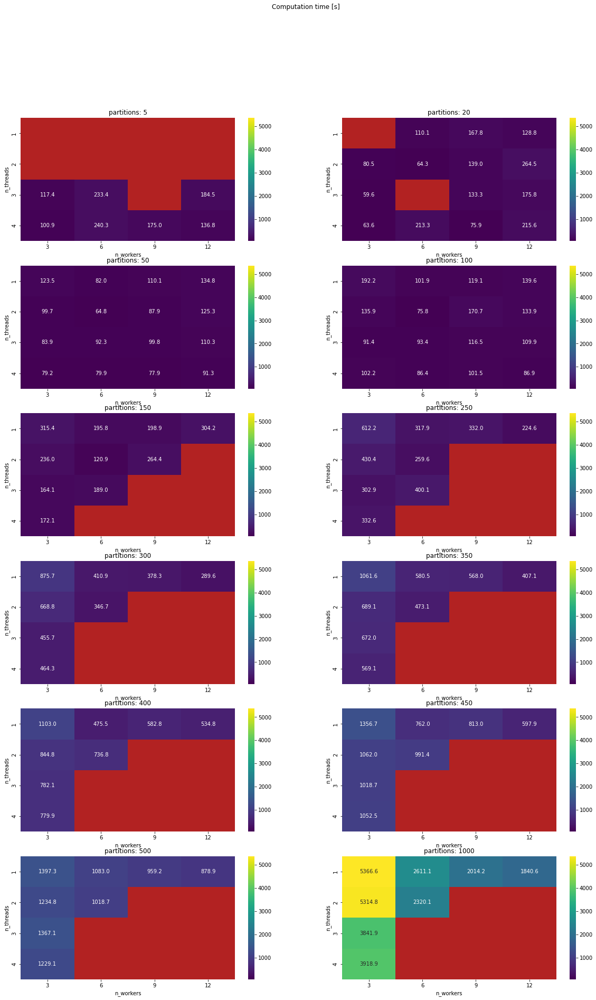

In [25]:
fig,axs=plt.subplots(int(len(npartitions)/2),2,figsize=[20,30])

# normalize colorbars equally
vmax=params.max().max()
vmin=params.min().min()

for i,nfiles in enumerate(params.index.get_level_values('n_partitions').unique()):
    axs.flatten()[i].set_title('partitions: {}'.format(nfiles))
    sns.heatmap(params.loc[nfiles],ax=axs.flatten()[i],vmax=vmax,vmin=vmin,annot=True,cmap='viridis',fmt=".1f")
    axs.flatten()[i].set_facecolor('firebrick')
    
fig.suptitle('Computation time [s]')

plt.show()

All the red squares is where the computation failed. 

Using a large number of partitions results in a large overhead due to the increasing number of tasks and thus the required communication. We can see this if we analyze the graph structure for two different numbers of partitions:

In [9]:
cluster = SSHCluster(
        ["10.67.22.118", # scheduler IP 
         "10.67.22.155", # workers IP
        "10.67.22.118" ,
        "10.67.22.10"], 
        connect_options={"known_hosts": None},
        worker_options={"n_workers": 3, # good configuration
                       "nthreads":3}, 
        scheduler_options={"port": 8798, "dashboard_address": ":8797"})

client = Client(cluster)

2022-07-27 08:16:07,266 - distributed.deploy.ssh - INFO - 2022-07-27 08:16:07,256 - distributed.http.proxy - INFO - To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
2022-07-27 08:16:07,324 - distributed.deploy.ssh - INFO - 2022-07-27 08:16:07,316 - distributed.scheduler - INFO - State start
2022-07-27 08:16:07,329 - distributed.deploy.ssh - INFO - 2022-07-27 08:16:07,321 - distributed.scheduler - INFO - Clear task state
2022-07-27 08:16:07,332 - distributed.deploy.ssh - INFO - 2022-07-27 08:16:07,321 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.118:8798
2022-07-27 08:16:08,947 - distributed.deploy.ssh - INFO - 2022-07-27 08:16:08,939 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33865'
2022-07-27 08:16:08,994 - distributed.deploy.ssh - INFO - 2022-07-27 08:16:08,986 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43859'
2022-07-27 08:16:09,0

In [16]:
# try with 20 partitions

# load
ids_titles_sorted = dd.read_parquet('/nfsvol/parquet/sorted_ids_titles',engine='pyarrow').repartition(20)
model_sorted = dd.read_parquet('/nfsvol/parquet/model_sorted',engine='pyarrow').repartition(20)

# prepare the join
embedded_papers = ids_titles_sorted.merge(
model_sorted, how="inner", left_index=True, right_index=True)
# compute
averaged_embedding=embedded_papers.groupby(['paper_id']).mean()

averaged_embedding.__dask_graph__()

HighLevelGraph with 23 layers.
<dask.highlevelgraph.HighLevelGraph object at 0x7fd220bb7b50>
 0. read-parquet-54217b66d7d81945467fa0754dc84bb0
 1. repartition-20-b99ca3cbef9c063bc7a0dc9924618f22
 2. repartition-20-b99ca3cbef9c063bc7a0dc9924618f22-index-f5861f5306e346d3e8e62a8cb04f3ef5
 3. to_frame-19e58683a00ebdde78cc9de6dc347a99
 4. partitioning_index-18da6a167c131ebf295a430aa507d6ac
 5. assign-eb661b23b04ab12da5c75aae6680baad
 6. simple-shuffle-f51f3168189071b7f9599e1b97dfb25d
 7. drop_by_shallow_copy-667c8239d3ca68f59fbc0cfc660f1558
 8. read-parquet-ed47537bc07f6ea0e730d576164d9bce
 9. repartition-20-70ac8150af12bbe9010f43b913c400a1
 10. repartition-20-70ac8150af12bbe9010f43b913c400a1-index-c502f208c280d33c06f70c67c3237b15
 11. to_frame-f535a0ed637727cafa5a5654e3ab7826
 12. partitioning_index-53683708283f3cd1bc4df4a4d8080ae1
 13. assign-ac84b7dfdaa47e90223bd3dd7248bc41
 14. simple-shuffle-320cccae40d4ab432bb2f95426279706
 15. drop_by_shallow_copy-d8952054eb43b832b1ec2541d1017f37
 16. merge_chunk-9c6c3a1360673fb3ba9966416eb93305
 17. dataframe-groupby-count-chunk-7251f0643d537a5290161073ca1fd4fe-b62dc7e3a6af6040b7e2d231f2f72cb6
 18. dataframe-groupby-count-agg-7251f0643d537a5290161073ca1fd4fe
 19. getitem-8c062d053fd02e9f5d2ef3b58972b388
 20. dataframe-groupby-sum-chunk-b4fe0efd2f841c44efbf65b5d62c7eb7-1b4bba316787f1b5891507ffe0fcb117
 21. dataframe-groupby-sum-agg-b4fe0efd2f841c44efbf65b5d62c7eb7
 22. truediv-fc1a7821526d13fa67f0703dfe6af301

In [17]:
averaged_embedding

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [18]:
# try with 1000 partitions

# load
ids_titles_sorted = dd.read_parquet('/nfsvol/parquet/sorted_ids_titles',engine='pyarrow').repartition(1000)
model_sorted = dd.read_parquet('/nfsvol/parquet/model_sorted',engine='pyarrow').repartition(1000)

# prepare the join
embedded_papers = ids_titles_sorted.merge(
model_sorted, how="inner", left_index=True, right_index=True)
# compute
averaged_embedding=embedded_papers.groupby(['paper_id']).mean()

averaged_embedding.__dask_graph__()

HighLevelGraph with 25 layers.
<dask.highlevelgraph.HighLevelGraph object at 0x7fd214f49b50>
 0. read-parquet-54217b66d7d81945467fa0754dc84bb0
 1. repartition-1000-b99ca3cbef9c063bc7a0dc9924618f22
 2. repartition-1000-b99ca3cbef9c063bc7a0dc9924618f22-index-e51f15563c1a5d6597af2ea37ed6c607
 3. to_frame-3f5a4bba8caf41b1354c87a8c85f56e1
 4. partitioning_index-e629ccb098d14b059f75f86577cacdaf
 5. assign-8ee0e3b6f6add23ef46ae84b9f568e4e
 6. shuffle-0-4742493d84205d0b38d3b09db78287da
 7. shuffle-1-4742493d84205d0b38d3b09db78287da
 8. drop_by_shallow_copy-81c3a2bbb3da638264f362238d300dd3
 9. read-parquet-ed47537bc07f6ea0e730d576164d9bce
 10. repartition-1000-70ac8150af12bbe9010f43b913c400a1
 11. repartition-1000-70ac8150af12bbe9010f43b913c400a1-index-84b4bed914c2133297e39a03cd3a1b4d
 12. to_frame-d14675c21673f1338899eb9184940d9d
 13. partitioning_index-129fc01feb911f8cbd0c9b512dd7f60c
 14. assign-72c8446da22237353fa8fa259ef65238
 15. shuffle-0-8d11612532723796454f1543c66f490a
 16. shuffle-1-8d11612532723796454f1543c66f490a
 17. drop_by_shallow_copy-a3917058fa259aee9deb13b8181ae32b
 18. merge_chunk-637950af0733c1fbca66664ec3c4acf3
 19. dataframe-groupby-count-chunk-140b11d838708f74a85e5aaefb6448ff-caa487a9e71643a8444bccae48df10da
 20. dataframe-groupby-count-agg-140b11d838708f74a85e5aaefb6448ff
 21. getitem-785c4955193cb075efb0442e1f29f0ee
 22. dataframe-groupby-sum-chunk-29b482177ab6d9ff5068ad43c8d598ac-c213a91b896ad825ea772d2a292268d4
 23. dataframe-groupby-sum-agg-29b482177ab6d9ff5068ad43c8d598ac
 24. truediv-33b871632433c4405b48d6d2172fd94a

In [19]:
averaged_embedding

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

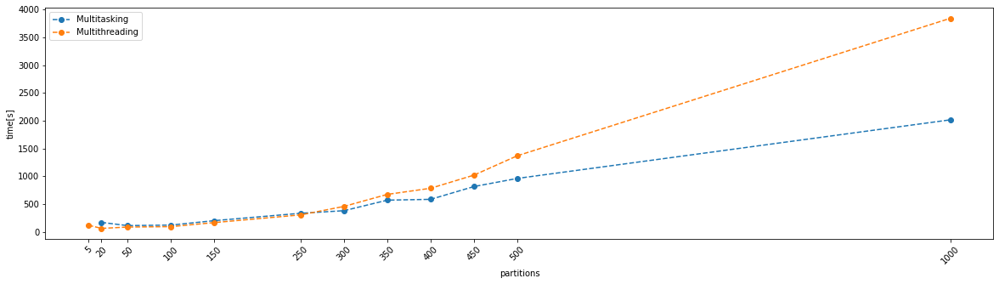

In [21]:
# maybe see how the multitasking (9 processes 1 thread)
# compares with the multithreading (3 processes 3 threads)
fig,ax=plt.subplots(figsize=[20,5])
ax.plot(params.swaplevel().loc[1][9],label='Multitasking',linestyle='--',marker='o')
ax.plot(params.swaplevel().loc[3][3],label='Multithreading',linestyle='--',marker='o')
ax.legend()
ax.set_xlabel('partitions')
ax.set_ylabel('time[s]')
ax.set_xticks(params.swaplevel().loc[1][9].index)
plt.xticks(rotation=45)
plt.show()

In [28]:
# shut down client 

client.shutdown()

2022-07-27 08:37:12,307 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
